# MRI Tumor Detection with Deep Learning

Welcome to this Jupyter Notebook dedicated to the development of an advanced MRI-based brain tumor detection model. In the rapidly evolving landscape of healthcare, Artificial Intelligence (AI) is playing a pivotal role in transforming various facets of medical diagnosis and treatment. This project focuses on harnessing the power of deep learning to enhance the speed and accuracy of detecting and localizing brain tumors in MRI scans.

## Project Overview

In collaboration with a leading medical diagnosis company in New York City, we are on a mission to revolutionize cancer diagnosis, particularly in the early detection of brain tumors. The significance of this endeavor lies in the potential to reduce the cost of cancer diagnosis and, more importantly, save lives through timely intervention.

## Key Objectives

Our primary task is to develop a robust deep learning model capable of efficiently detecting and localizing brain tumors in MRI scans. To achieve this, we have been provided with a dataset consisting of 3929 brain MRI scans, each annotated with the location of the tumor. The proposed solution involves the implementation of a layered deep learning pipeline, incorporating both classification and segmentation techniques.

## Architecture Overview

The architecture we'll be leveraging comprises two essential components:
- **ResNet Deep Learning Classifier Model:** This component is designed to classify MRI scans as either having or not having a brain tumor. Residual Neural Networks (ResNets) are employed to overcome challenges associated with vanishing gradients, ensuring effective training even with deep architectures.
- **ResUNet Segmentation Model:** The segmentation model, based on the ResUNet architecture, enables pixel-level localization of tumors. This involves understanding and extracting information from images at the pixel level, providing detailed masks that pinpoint tumor locations.

## Transfer Learning

To expedite the training process and capitalize on existing knowledge, we will be employing transfer learning. This technique involves repurposing a pre-trained model, specifically ResNet, for our brain tumor detection task. Transfer learning offers advantages such as faster training progress and the ability to achieve remarkable results with a relatively small training dataset.

## Getting Started

Before diving into the implementation, ensure you have the necessary dependencies installed. Additionally, familiarize yourself with the provided dataset and the project's structure. The full list of startups and resources mentioned in this document can be referred to for further insights.

Let's embark on this journey to leverage AI and cutting-edge technologies to contribute to the early diagnosis and effective management of brain tumors. Together, with AI and bright minds, we aim to eliminate diseases and make a lasting impact on healthcare.


# Dependencies

To kick off our MRI Tumor Detection project, let's ensure we have all the necessary libraries and frameworks installed. Below are the key dependencies we'll be utilizing for data manipulation, visualization, and deep learning implementation:


Ensure that you have the required packages installed to seamlessly execute the subsequent code cells. If any libraries are missing, you can install them using `!pip install <package_name>` in a code cell within your Jupyter Notebook or Google Colab environment.


In [29]:
pip install opencv-python


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [30]:
pip install opencv-python-headless


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [31]:
import cv2
print(cv2.__version__)


4.11.0


In [32]:
pip install tensorflow


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [33]:
%pip install scikit-image
%pip install seaborn scikit-learn

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [34]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import cv2
import tensorflow as tf
from skimage import io
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from IPython.display import display
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler, normalize
import os
import glob
import random
%matplotlib inline

Loading the dataset into brain_df variable

In [35]:
# data containing path to Brain MRI and their corresponding mask
brain_df = pd.read_csv('data_mask.csv')
brain_df.head()


,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0


In [36]:
brain_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  3929 non-null   object
 1   image_path  3929 non-null   object
 2   mask_path   3929 non-null   object
 3   mask        3929 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 122.9+ KB


The code brain_df['mask'].value_counts().index is used to retrieve the unique values of the 'mask' column in the DataFrame brain_df, along with their respective counts. This is valuable for understanding the distribution of different categories or classes within the 'mask' column.

In [37]:
brain_df['mask'].value_counts().index

Int64Index([0, 1], dtype='int64')

0 means no brain tumor
1 means brain tumor

Use plotly to plot interactive bar chart


In [38]:
# Use plotly to plot interactive bar chart
import plotly.graph_objects as go

fig = go.Figure([go.Bar(x = brain_df['mask'].value_counts().index, y = brain_df['mask'].value_counts())])
fig.update_traces(marker_color = 'rgb(0,200,0)', marker_line_color = 'rgb(0,255,0)',
                  marker_line_width = 10, opacity = 0.5)
fig.show()

In [39]:
brain_df.mask_path

0       TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...
1       TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...
2       TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...
3       TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...
4       TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...
                              ...                        
3924    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...
3928    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_88...
Name: mask_path, Length: 3929, dtype: object

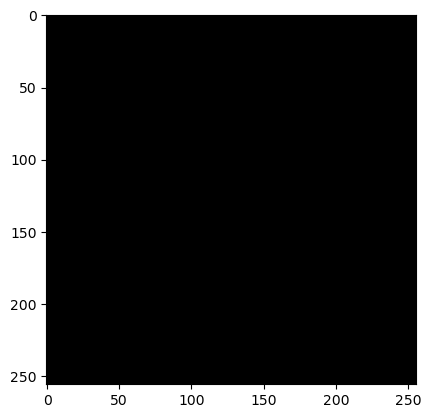

In [40]:
mask_image = cv2.imread(brain_df.mask_path[0])
if mask_image is not None:
	plt.imshow(mask_image)
else:
	print("Error: Image not found or unable to read the image.")
# brain_df.mask_path[623]

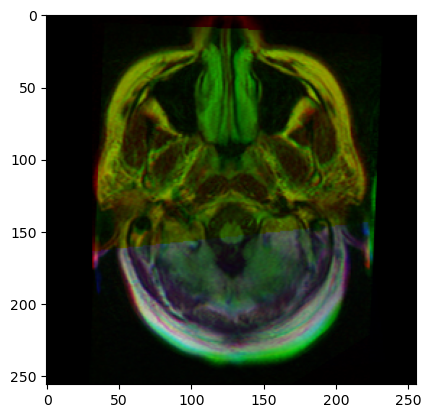

In [41]:
image_path = brain_df.image_path[0]
image = cv2.imread(image_path)

if image is not None:
	image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
	plt.imshow(image_rgb)
else:
	print(f"Error: Unable to read the image at path {image_path}")

In [42]:
cv2.imread(brain_df.mask_path[0]).max()

0

In [43]:
cv2.imread(brain_df.mask_path[0]).min()

0

Error: Unable to load image or mask for index 979
Error: Unable to load image or mask for index 2120
Error: Unable to load image or mask for index 1622
Error: Unable to load image or mask for index 767
Error: Unable to load image or mask for index 460


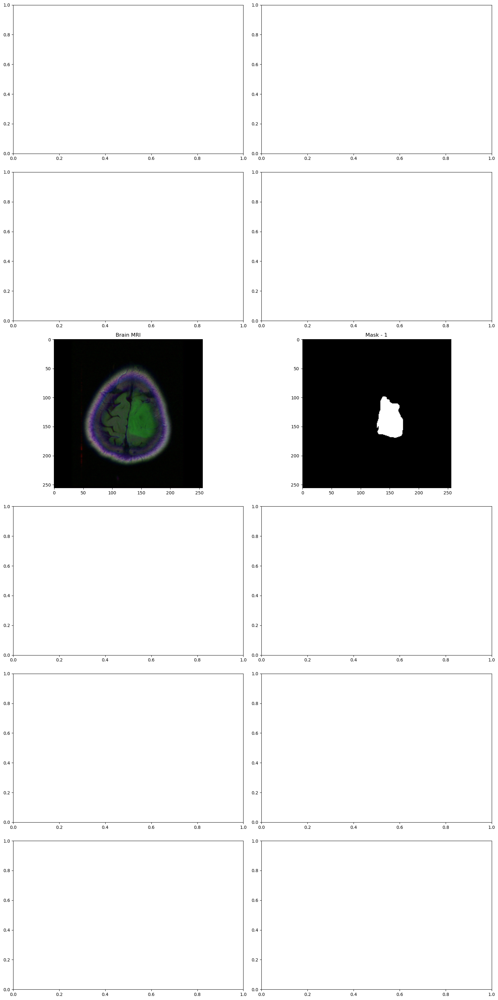

In [44]:
import random
fig, axs = plt.subplots(6, 2, figsize=(16, 32))
count = 0

for x in range(6):
    i = random.randint(0, len(brain_df))
    # Load and display the MRI image
    mri_image = cv2.imread(brain_df.image_path[i])
    mask_image = cv2.imread(brain_df.mask_path[i])
    
    if mri_image is not None and mask_image is not None:
        axs[count][0].title.set_text("Brain MRI")  # Set MRI title
        axs[count][0].imshow(cv2.cvtColor(mri_image, cv2.COLOR_BGR2RGB))  # Display MRI (convert BGR to RGB)
        
        axs[count][1].title.set_text(f"Mask - {brain_df['mask'][i]}")  # Set mask title
        axs[count][1].imshow(cv2.cvtColor(mask_image, cv2.COLOR_BGR2RGB))  # Display mask (convert BGR to RGB)
    else:
        print(f"Error: Unable to load image or mask for index {i}")

    count += 1

fig.tight_layout()
plt.show()


File not found: TCGA_HT_7680_19970202/TCGA_HT_7680_19970202_5.tif or TCGA_HT_7680_19970202/TCGA_HT_7680_19970202_5_mask.tif
File not found: TCGA_HT_7680_19970202/TCGA_HT_7680_19970202_6.tif or TCGA_HT_7680_19970202/TCGA_HT_7680_19970202_6_mask.tif
File not found: TCGA_HT_7602_19951103/TCGA_HT_7602_19951103_6.tif or TCGA_HT_7602_19951103/TCGA_HT_7602_19951103_6_mask.tif
File not found: TCGA_HT_7694_19950404/TCGA_HT_7694_19950404_6.tif or TCGA_HT_7694_19950404/TCGA_HT_7694_19950404_6_mask.tif
File not found: TCGA_HT_7884_19980913/TCGA_HT_7884_19980913_6.tif or TCGA_HT_7884_19980913/TCGA_HT_7884_19980913_6_mask.tif
File not found: TCGA_CS_5397_20010315/TCGA_CS_5397_20010315_7.tif or TCGA_CS_5397_20010315/TCGA_CS_5397_20010315_7_mask.tif
File not found: TCGA_CS_6290_20000917/TCGA_CS_6290_20000917_7.tif or TCGA_CS_6290_20000917/TCGA_CS_6290_20000917_7_mask.tif
File not found: TCGA_FG_A4MT_20020212/TCGA_FG_A4MT_20020212_7.tif or TCGA_FG_A4MT_20020212/TCGA_FG_A4MT_20020212_7_mask.tif
File not

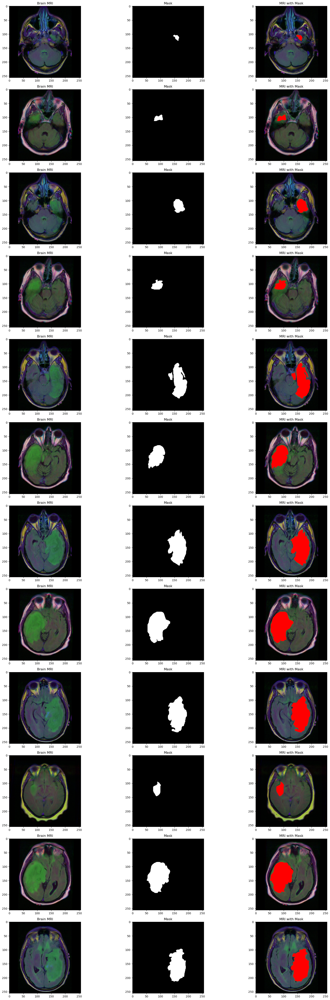

In [45]:
import os
import random
from skimage import io
import matplotlib.pyplot as plt

count = 0
fig, axs = plt.subplots(12, 3, figsize=(20, 50))
for i in range(len(brain_df)):
    if brain_df['mask'][i] == 1 and count < 12:
        img_path = brain_df.image_path[i]
        mask_path = brain_df.mask_path[i]

        # Check if both image and mask files exist
        if os.path.exists(img_path) and os.path.exists(mask_path):
            img = io.imread(img_path)
            mask = io.imread(mask_path)

            axs[count][0].title.set_text('Brain MRI')
            axs[count][0].imshow(img)

            axs[count][1].title.set_text('Mask')
            axs[count][1].imshow(mask, cmap='gray')

            # Overlay mask on MRI
            img[mask == 255] = (255, 0, 0)
            axs[count][2].title.set_text('MRI with Mask')
            axs[count][2].imshow(img)

            count += 1
        else:
            print(f"File not found: {img_path} or {mask_path}")

fig.tight_layout()
plt.show()



In [46]:
# Drop the patient id column
brain_df_train = brain_df.drop(columns = ['patient_id'])
brain_df_train.shape

(3929, 3)

In [47]:
# Convert the data in mask column to string format, to use categorical mode in flow_from_dataframe
# You will get this error message if you comment out the following code line:
# TypeError: If class_mode="categorical", y_col="mask" column values must be type string, list or tuple.

brain_df_train['mask'] = brain_df_train['mask'].apply(lambda x: str(x))
brain_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


In [48]:
# split the data into train and test data

from sklearn.model_selection import train_test_split

train, test = train_test_split(brain_df_train, test_size = 0.15)

In [49]:
# create a image generator
%pip install keras_preprocessing
from keras_preprocessing.image import ImageDataGenerator

# Create a data generator which scales the data from 0 to 1 and makes validation split of 0.15
datagen = ImageDataGenerator(rescale=1./255., validation_split = 0.15)


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [50]:
train_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="training",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(256,256))


valid_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="validation",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(256,256))

# Create a data generator for test images
test_datagen=ImageDataGenerator(rescale=1./255.)

test_generator=test_datagen.flow_from_dataframe(
dataframe=test,
directory= './',
x_col='image_path',
y_col='mask',
batch_size=16,
shuffle=False,
class_mode='categorical',
target_size=(256,256))



Found 90 validated image filenames belonging to 2 classes.
Found 15 validated image filenames belonging to 2 classes.
Found 18 validated image filenames belonging to 2 classes.


C:\Users\priya\AppData\Roaming\Python\Python311\site-packages\keras_preprocessing\image\dataframe_iterator.py:279: UserWarning:

Found 3234 invalid image filename(s) in x_col="image_path". These filename(s) will be ignored.

C:\Users\priya\AppData\Roaming\Python\Python311\site-packages\keras_preprocessing\image\dataframe_iterator.py:279: UserWarning:

Found 3234 invalid image filename(s) in x_col="image_path". These filename(s) will be ignored.

C:\Users\priya\AppData\Roaming\Python\Python311\site-packages\keras_preprocessing\image\dataframe_iterator.py:279: UserWarning:

Found 572 invalid image filename(s) in x_col="image_path". These filename(s) will be ignored.



In [51]:
# Get the ResNet50 base model
basemodel = ResNet50(weights = 'imagenet', include_top = False, input_tensor = Input(shape=(256, 256, 3)))

In [52]:
basemodel.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 262, 262,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 128, 128,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 128, 128,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 128, 128,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 130, 130,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 64, 64,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 64, 64,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 64, 64,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 64, 64,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 64, 64,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 64, 64,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 64, 64,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 64, 64,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 64, 64,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [53]:
# freeze the model weights

for layer in basemodel.layers:
  layers.trainable = False

In [54]:
# Add classification head to the base model

headmodel = basemodel.output
headmodel = AveragePooling2D(pool_size = (4,4))(headmodel)
headmodel = Flatten(name= 'flatten')(headmodel)
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.3)(headmodel)#
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.3)(headmodel)
#headmodel = Dense(256, activation = "relu")(headmodel)
#headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(2, activation = 'softmax')(headmodel)

model = Model(inputs = basemodel.input, outputs = headmodel)

In [55]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 262, 262,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 128, 128,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 128, 128,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 128, 128,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 130, 130,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 64, 64,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 64, 64,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 64, 64,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 64, 64,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 64, 64,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 64, 64,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 64, 64,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 64, 64,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 64, 64,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_3_c

 Total params: 25,751,426 (98.23 MB)

 Trainable params: 25,698,306 (98.03 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [56]:
# compile the model
model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics= ["accuracy"])

In [57]:
# use early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

# save the best model with least validation loss
checkpointer = ModelCheckpoint(filepath="classifier-resnet-weights.keras", verbose=1, save_best_only=True)

In [58]:
history = model.fit(train_generator, steps_per_epoch= train_generator.n // 16, epochs = 1, validation_data= valid_generator, validation_steps= valid_generator.n // 16, callbacks=[checkpointer, earlystopping])

C:\Users\priya\AppData\Roaming\Python\Python311\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.

C:\Users\priya\AppData\Roaming\Python\Python311\site-packages\keras\src\models\functional.py:237: UserWarning:

The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_175']
Received: inputs=Tensor(shape=(None, 256, 256, 3))



5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.4685 - loss: 1.8416
Epoch 1: val_loss improved from inf to 11.08144, saving model to classifier-resnet-weights.keras
5/5 ━━━━━━━━━━━━━━━━━━━━ 119s 8s/step - accuracy: 0.4805 - loss: 1.8926 - val_accuracy: 0.4667 - val_loss: 11.0814


In [59]:
# save the model architecture to json file for future use

model_json = model.to_json()
with open("classifier-resnet-model.json","w") as json_file:
  json_file.write(model_json)

In [60]:
import os
print("Current Directory:", os.getcwd())
print("Files in Directory:", os.listdir())
print("Does weights.hdf5 exist?", os.path.exists('weights.hdf5'))


Current Directory: e:\projects\New folder22
Files in Directory: ['.DS_Store', '.git', '.gitignore', 'classifier-resnet-model.json', 'classifier-resnet-weights.keras', 'data.csv', 'data_mask.csv', 'index.ipynb', 'resnet-50-MRI.json', 'ResUNet-model.json', 'ResUNet-MRI.json', 'ResUNet-weights.keras', 'TCGA_CS_4941_19960909', 'TCGA_CS_4942_19970222', 'TCGA_CS_4943_20000902', 'TCGA_CS_4944_20010208', 'TCGA_CS_5393_19990606', 'TCGA_CS_5395_19981004', 'utilities.py', 'weights.hdf5', 'weights_seg.hdf5']
Does weights.hdf5 exist? True


In [61]:
from tensorflow.keras.models import Model
from tensorflow.keras.saving import register_keras_serializable

# Register the Model class
@register_keras_serializable()
class CustomModel(Model):
    pass

# Register the Model class itself
@register_keras_serializable()
class RegisteredModel(Model):
    pass

# Load pretrained model (instead of training the model for 1+ hours) 
with open('resnet-50-MRI.json', 'r') as json_file:
    json_savedModel= json_file.read()
# load the model  
model = tf.keras.models.model_from_json(json_savedModel, custom_objects={'CustomModel': CustomModel, 'Model': RegisteredModel})

# Check if weights file exists
weights_path = 'weights.hdf5'
if os.path.exists(weights_path):
    model.load_weights(weights_path)
else:
    print(f"Error: Weights file '{weights_path}' not found. Please ensure the file exists or train the model to generate the weights.")
    
model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics= ["accuracy"])

In [62]:
test_predict = model.predict(test_generator, steps = test_generator.n // 16, verbose =1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step


//first class      ,  //second class

In [63]:
test_predict

array([[1.00000000e+00, 1.42271837e-23],
       [8.47182155e-01, 1.52817786e-01],
       [9.99999881e-01, 1.69695497e-07],
       [7.46338398e-17, 1.00000000e+00],
       [1.00000000e+00, 3.86644992e-08],
       [1.00000000e+00, 1.05869134e-15],
       [9.96925533e-01, 3.07444320e-03],
       [9.99955416e-01, 4.45862897e-05],
       [1.00000000e+00, 1.05504784e-13],
       [9.99898434e-01, 1.01499369e-04],
       [2.50886478e-05, 9.99974966e-01],
       [9.96984422e-01, 3.01555591e-03],
       [8.48970747e-16, 1.00000000e+00],
       [9.94462073e-01, 5.53795323e-03],
       [1.00000000e+00, 2.19917472e-15],
       [9.99999762e-01, 2.96280064e-07]], dtype=float32)

In [64]:
predict = []

for i in test_predict:
  predict.append(str(np.argmax(i)))

predict = np.asarray(predict)

In [65]:
predict

array(['0', '0', '0', '1', '0', '0', '0', '0', '0', '0', '1', '0', '1',
       '0', '0', '0'], dtype='<U1')

In [66]:
original = np.asarray(test['mask'])[:len(predict)]
len(original)

16

In [67]:
# Obtain the accuracy of the model
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(original, predict)
accuracy

0.625

<Axes: >

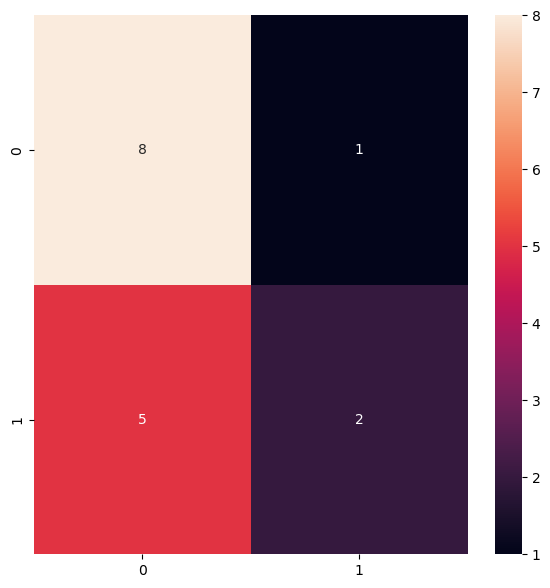

In [68]:
# plot the confusion matrix
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(original, predict)
plt.figure(figsize = (7,7))
sns.heatmap(cm, annot=True)

In [69]:
from sklearn.metrics import classification_report

report = classification_report(original, predict, labels = [0,1])
print(report)

              precision    recall  f1-score   support

           0       0.62      0.89      0.73         9
           1       0.67      0.29      0.40         7

   micro avg       0.62      0.62      0.62        16
   macro avg       0.64      0.59      0.56        16
weighted avg       0.64      0.62      0.58        16



In [70]:
# Get the dataframe containing MRIs which have masks associated with them.
brain_df_mask = brain_df[brain_df['mask'] == 1]
brain_df_mask.shape

(1373, 4)

In [71]:
# split the data into train and test data

from sklearn.model_selection import train_test_split

X_train, X_val = train_test_split(brain_df_mask, test_size=0.15)
X_test, X_val = train_test_split(X_val, test_size=0.5)

In [72]:
train_ids = list(X_train.image_path)
train_mask = list(X_train.mask_path)

val_ids = list(X_val.image_path)
val_mask= list(X_val.mask_path)

In [73]:
# Utilities file contains the code for custom loss function and custom data generator
from utilities import DataGenerator

# create image generators

training_generator = DataGenerator(train_ids,train_mask)
validation_generator = DataGenerator(val_ids,val_mask)

In [74]:
def resblock(X, f):
  

  # make a copy of input
  X_copy = X

  # main path
  # Read more about he_normal: https://medium.com/@prateekvishnu/xavier-and-he-normal-he-et-al-initialization-8e3d7a087528

  X = Conv2D(f, kernel_size = (1,1) ,strides = (1,1),kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)
  X = Activation('relu')(X) 

  X = Conv2D(f, kernel_size = (3,3), strides =(1,1), padding = 'same', kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)

  # Short path
  # Read more here: https://towardsdatascience.com/understanding-and-coding-a-resnet-in-keras-446d7ff84d33

  X_copy = Conv2D(f, kernel_size = (1,1), strides =(1,1), kernel_initializer ='he_normal')(X_copy)
  X_copy = BatchNormalization()(X_copy)

  # Adding the output from main path and short path together

  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  return X

In [75]:
# function to upscale and concatenate the values passsed
def upsample_concat(x, skip):
  x = UpSampling2D((2,2))(x)
  merge = Concatenate()([x, skip])

  return merge

In [76]:
input_shape = (256,256,3)

# Input tensor shape
X_input = Input(input_shape)

# Stage 1
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(X_input)
conv1_in = BatchNormalization()(conv1_in)
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(conv1_in)
conv1_in = BatchNormalization()(conv1_in)
pool_1 = MaxPool2D(pool_size = (2,2))(conv1_in)

# Stage 2
conv2_in = resblock(pool_1, 32)
pool_2 = MaxPool2D(pool_size = (2,2))(conv2_in)

# Stage 3
conv3_in = resblock(pool_2, 64)
pool_3 = MaxPool2D(pool_size = (2,2))(conv3_in)

# Stage 4
conv4_in = resblock(pool_3, 128)
pool_4 = MaxPool2D(pool_size = (2,2))(conv4_in)

# Stage 5 (Bottle Neck)
conv5_in = resblock(pool_4, 256)

# Upscale stage 1
up_1 = upsample_concat(conv5_in, conv4_in)
up_1 = resblock(up_1, 128)

# Upscale stage 2
up_2 = upsample_concat(up_1, conv3_in)
up_2 = resblock(up_2, 64)

# Upscale stage 3
up_3 = upsample_concat(up_2, conv2_in)
up_3 = resblock(up_3, 32)

# Upscale stage 4
up_4 = upsample_concat(up_3, conv1_in)
up_4 = resblock(up_4, 16)

# Final Output
output = Conv2D(1, (1,1), padding = "same", activation = "sigmoid")(up_4)

model_seg = Model(inputs = X_input, outputs = output )


In [77]:
model_seg.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        448 │ input_layer_2[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │         64 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      2,320 │ batch_normalizat… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │         64 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │        544 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │      9,248 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │        544 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 128, 128,  │          0 │ add[0][0]         │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │      2,112 │ max_pooling2d_1[

 Total params: 1,210,513 (4.62 MB)

 Trainable params: 1,206,129 (4.60 MB)

 Non-trainable params: 4,384 (17.12 KB)

In [78]:
# from utilities import focal_tversky, tversky_loss, tversky
from utilities import focal_tversky, tversky_loss,tversky

In [79]:
# Install tf_keras package
%pip install tf_keras

# Set environment variable to use legacy keras
import os 
os.environ['TF_USE_LEGACY_KERAS'] = 'True'

import tensorflow as tf
from tensorflow.keras.optimizers import Adam

# Compile the model
legacy_adam = Adam(learning_rate=0.05, epsilon=0.1)
model_seg.compile(optimizer=legacy_adam, loss=focal_tversky, metrics=[tversky])

Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.



In [80]:
# use early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

# save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath="ResUNet-weights.keras", verbose=1, save_best_only=True)

In [95]:
if not train_ids_filtered or not val_ids_filtered:
    raise ValueError("No valid files found for training or validation. Please check file paths.")


In [97]:
import os

# Filter out only the existing files
train_ids_filtered = [path for path in train_ids if os.path.exists(path)]
train_mask_filtered = [mask for mask, path in zip(train_mask, train_ids) if os.path.exists(path)]
val_ids_filtered = [path for path in val_ids if os.path.exists(path)]
val_mask_filtered = [mask for mask, path in zip(val_mask, val_ids) if os.path.exists(path)]

# Print missing files warning but proceed with available data
missing_files = list(set(train_ids + val_ids) - set(train_ids_filtered + val_ids_filtered))

if missing_files:
    print(f"Warning: The following files are missing and will be skipped: {missing_files}")

# Create new generators with filtered data
training_generator = DataGenerator(train_ids_filtered, train_mask_filtered)
validation_generator = DataGenerator(val_ids_filtered, val_mask_filtered)

# Proceed with training using filtered datasets
history = model_seg.fit(training_generator, 
                        epochs=1, 
                        validation_data=validation_generator, 
                        callbacks=[checkpointer, earlystopping])


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - loss: 0.7726 - tversky: 0.2909

ValueError: The PyDataset has length 0

In [ ]:
# save the model architecture to json file for future use

model_json = model_seg.to_json()
with open("ResUNet-model.json","w") as json_file:
  json_file.write(model_json)

In [ ]:
from utilities import focal_tversky, tversky_loss, tversky
from tensorflow.keras.models import Model
from tensorflow.keras.saving import register_keras_serializable

# Register the Model class
@register_keras_serializable()
class CustomModel(Model):
    pass

# Register the Model class itself
@register_keras_serializable()
class RegisteredModel(Model):
    pass

with open('ResUNet-MRI.json', 'r') as json_file:
    json_savedModel= json_file.read()

# load the model architecture 
model_seg = tf.keras.models.model_from_json(json_savedModel, custom_objects={'CustomModel': CustomModel, 'Model': RegisteredModel})
model_seg.load_weights('weights_seg.hdf5')

# Use the legacy_adam optimizer defined in CELL INDEX: 57
model_seg.compile(optimizer=legacy_adam, loss=focal_tversky, metrics=[tversky])

In [ ]:
from utilities import prediction
import os

# Filter out only the existing files
test_filtered = test[test['image_path'].apply(os.path.exists)].copy()

# Check for missing files
missing_files = set(test['image_path']) - set(test_filtered['image_path'])

if missing_files:
    print(f"Warning: The following files are missing and will be skipped: {missing_files}")

# Proceed with prediction using filtered dataset
image_id, mask, has_mask = prediction(test_filtered, model, model_seg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229

In [ ]:
# creating a dataframe for the result
df_pred = pd.DataFrame({'image_path': image_id,'predicted_mask': mask,'has_mask': has_mask})
df_pred

,image_path,predicted_mask,has_mask
0,TCGA_DU_5849_19950405/TCGA_DU_5849_19950405_23...,"[[[[8.034336e-07], [3.3639599e-06], [8.681993e...",1
1,TCGA_CS_5397_20010315/TCGA_CS_5397_20010315_2.tif,No mask,0
2,TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_23...,No mask,0
3,TCGA_DU_5854_19951104/TCGA_DU_5854_19951104_22...,"[[[[7.924301e-07], [2.9825246e-06], [6.438584e...",1
4,TCGA_CS_6665_20010817/TCGA_CS_6665_20010817_12...,"[[[[7.5913704e-07], [3.062214e-06], [7.008035e...",1
...,...,...,...
219,TCGA_HT_7881_19981015/TCGA_HT_7881_19981015_63...,No mask,0
220,TCGA_HT_7608_19940304/TCGA_HT_7608_19940304_20...,"[[[[6.0880774e-07], [1.9412626e-06], [3.093497...",1
221,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_16...,No mask,0
222,TCGA_DU_7294_19890104/TCGA_DU_7294_19890104_17...,No mask,0


In [ ]:
# Merge the dataframe containing predicted results with the original test data.
df_pred = test.merge(df_pred, on = 'image_path')
df_pred.head()

,image_path,mask_path,mask,predicted_mask,has_mask
0,TCGA_DU_5849_19950405/TCGA_DU_5849_19950405_23...,TCGA_DU_5849_19950405/TCGA_DU_5849_19950405_23...,1,"[[[[8.034336e-07], [3.3639599e-06], [8.681993e...",1
1,TCGA_CS_5397_20010315/TCGA_CS_5397_20010315_2.tif,TCGA_CS_5397_20010315/TCGA_CS_5397_20010315_2_...,0,No mask,0
2,TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_23...,TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_23...,0,No mask,0
3,TCGA_DU_5854_19951104/TCGA_DU_5854_19951104_22...,TCGA_DU_5854_19951104/TCGA_DU_5854_19951104_22...,1,"[[[[7.924301e-07], [2.9825246e-06], [6.438584e...",1
4,TCGA_CS_6665_20010817/TCGA_CS_6665_20010817_12...,TCGA_CS_6665_20010817/TCGA_CS_6665_20010817_12...,1,"[[[[7.5913704e-07], [3.062214e-06], [7.008035e...",1


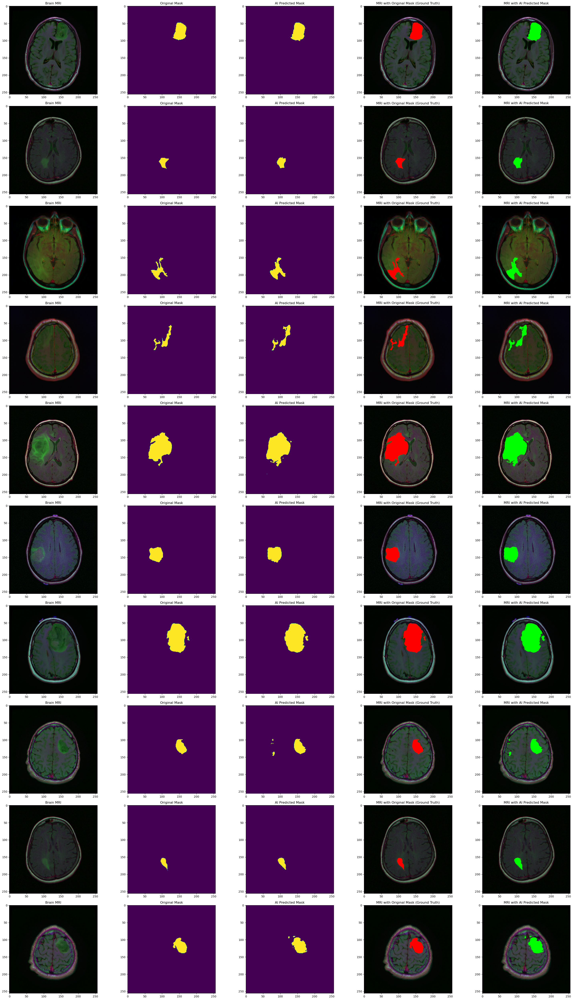

In [ ]:
count = 0 
fig, axs = plt.subplots(10, 5, figsize=(30, 50))
for i in range(len(df_pred)):
  if df_pred['has_mask'][i] == 1 and count < 10:
    # read the images and convert them to RGB format
    img = io.imread(df_pred.image_path[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    # Obtain the mask for the image 
    mask = io.imread(df_pred.mask_path[i])
    axs[count][1].title.set_text("Original Mask")
    axs[count][1].imshow(mask)

    # Obtain the predicted mask for the image 
    predicted_mask = np.asarray(df_pred.predicted_mask[i])[0].squeeze().round()
    axs[count][2].title.set_text("AI Predicted Mask")
    axs[count][2].imshow(predicted_mask)
    
    # Apply the mask to the image 'mask==255'
    img[mask == 255] = (255, 0, 0)
    axs[count][3].title.set_text("MRI with Original Mask (Ground Truth)")
    axs[count][3].imshow(img)

    img_ = io.imread(df_pred.image_path[i])
    img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
    img_[predicted_mask == 1] = (0, 255, 0)
    axs[count][4].title.set_text("MRI with AI Predicted Mask")
    axs[count][4].imshow(img_)
    count += 1

fig.tight_layout()

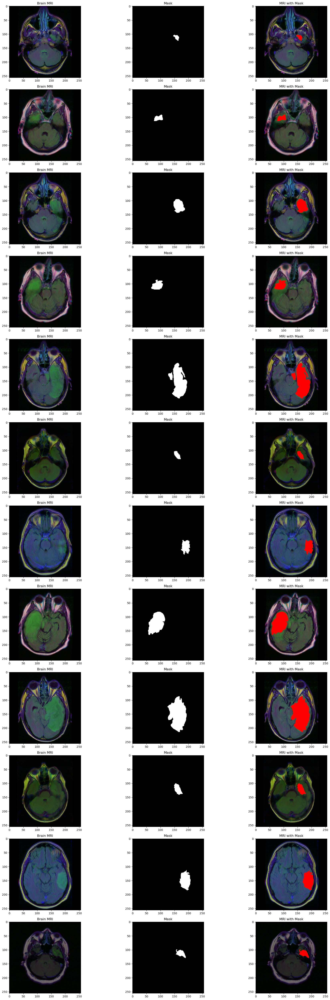

In [ ]:
# Advanced Visualization: visualize the MRI scans along with their mask on one image 
count = 0 
fig, axs = plt.subplots(12, 3, figsize=(20, 50))

# Filter out only the existing files
brain_df_filtered = brain_df[brain_df['image_path'].apply(os.path.exists) & brain_df['mask_path'].apply(os.path.exists)].copy()

for i in range(len(brain_df_filtered)):
    if int(brain_df_filtered['mask'].iloc[i]) == 1 and count < 12:
        # read the images 
        img = io.imread(brain_df_filtered.image_path.iloc[i])
        # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axs[count][0].title.set_text("Brain MRI")
        axs[count][0].imshow(img)

        # obtain the mask for the image 
        mask = io.imread(brain_df_filtered.mask_path.iloc[i])
        axs[count][1].title.set_text("Mask")
        axs[count][1].imshow(mask, cmap='gray')

        # replace the values in the image with red color (255,0,0) if any mask pixel in the mask was = 255 
        img[mask == 255] = (255, 0, 0)
        axs[count][2].title.set_text("MRI with Mask")
        axs[count][2].imshow(img)
        count += 1

fig.tight_layout()